In [7]:
import numpy as np 
# from scipy.integrate import ode 
import matplotlib.pyplot as plt 
import pandas as pd
from PIL import Image

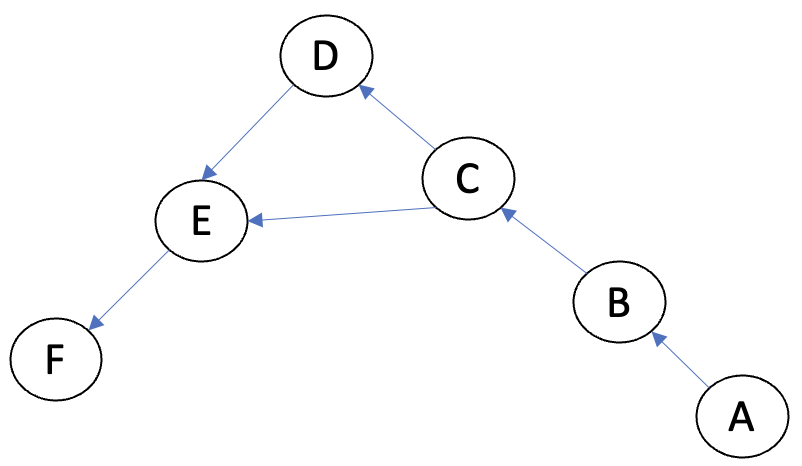

In [8]:
Image.open('networkexample.png')

### NETWORKS ADJACENCY MATRIX
From the network shown above, we can derive two types of adjacency matrix:

Indirected network: in which the direction of the relations is not considered, just if there is a connection or not between the nodes

$$A = \begin{bmatrix}
0 & 1 & 0 & 0 & 0 & 0\\
1 & 0 & 1 & 0 & 0 & 0\\
0 & 1 & 0 & 1 & 1 & 0\\
0 & 0 & 1 & 0 & 1 & 0\\
0 & 0 & 1 & 1 & 0 & 1\\
0 & 0 & 0 & 0 & 1 & 0
\end{bmatrix}$$

Directed network: the direction of the interaction is considered. In this case each column says which connections come out of that node and each row from which node come each connection. This is for computing the in-degree connection of each node, if we transpose A, then that adjacency matrix will be used to compute the out-degree connections.

$$A = \begin{bmatrix}
0 & 0 & 0 & 0 & 0 & 0\\
1 & 0 & 0 & 0 & 0 & 0\\
0 & 1 & 0 & 0 & 0 & 0\\
0 & 0 & 1 & 0 & 0 & 0\\
0 & 0 & 1 & 1 & 0 & 0\\
0 & 0 & 0 & 0 & 1 & 0
\end{bmatrix}$$




#### UNDIRECTED NETWORK

### 4 different types of centrality:
1) Degree-based centrality (DBC): How many connections each node has.

$$\textbf{c}=\textbf{AI}$$

2) Eigen-vector centrality (EC): This is not just about how many connections each node has but how connected are those surrounding nodes too. That is why centrality of each node weighted by the centrality of surrounding nodes as shown in the following equation:

$$ c_i = \frac{1}{r} \sum_{j=1}^{n} A_{ij}c_j$$

This is an eigenvalue problem in which r is the maximum eigevalue associated to the indirected adjacency matrix and c is the corresponding eigenvector.

3) Katz centrality (KZ): How connected each node is but in a directed network. Here a "baseline" centrality is introduced to avoid propagation of zero centrality through all network nodes this can be .

$$\textbf{c}=\alpha A\beta\textbf{e}$$
$$\textbf{c}=\beta\left(\textbf{I}-\alpha\textbf{A}\right)^{-1}\textbf{e}$$
With $0<\alpha<\frac{1}{r}$ and the coefficient for the "baseline centrality $\beta>0$

4) Betweenness centrality (BC): It is often used to find nodes that serve as a bridge from one part of a graph to another.

#### CODE TO GET THE ADJACENCY MATRIX OF THREE DIFFERENT CASES OF THE CELL SIGNALING NETWORK ASSOCIATED WITH FIBROBLAST ACTIVITY
The three different cases are:
1. Un-directed network in which the direct associations between chemical species are not considered, but how related that node is with others. In this case Eigenvector Centrality Analysis (ECA) was also computed to account for the connectivity of the surrounding nodes.
2. Directed network computing the in-degree centrality. Here we consider the number of incoming links or connections to a node in a directed network. In other words, it quantifies the number of nodes that point to a given node. 
Katz centrality analysis is conducted to eliminate the in-degree zero centrality propagation that the ECA might provoke.
3. Directed network computing the out-degree centrality. Is a way to count the connections or links that leave a node in a directed network. It counts the nodes that a specific node points to. Katz - centrality is also conducted here.

In [9]:
# Here we read a .csv file that contains all the interactions between the nodes. Is basically a matrix with two columns: the first one
# contains the nodes from which the interaction begin and the second where the direction goes. 
# Each interaction can be found on each row. These interactions represent chemical species activation during a cell signaling cascade
# so for instance if the protein MMP2 activates (phosporilates) TGFB, then direction of the interaction is from MMP2 to TGFB. In this example
# MMP2 is in the first column of the first row, and TGFB in the second column of the first row.

#Read file with the interactions
relations1 = pd.read_csv('directrelations.csv')
relations = relations1.to_numpy()[:,:]

#Read names and its corresponding numbers shown in the cell below
namess=pd.read_csv('namesposition.csv')
namesposi=namess.to_numpy()[:,:]

In [10]:
# Here I enumerate all the chemical species or nodes of the signaling cascade network.

NOX = 0 
ROS = 1 
CBP = 2 
TGFB = 3 
TGFB1R = 4 
smad3 = 5 
smad7 = 6 
latentTGFB = 7 
BAMBI = 8 
PDGF = 9 
PDGFR = 10 
mechanical = 11 
B1int = 12 
Rho = 13 
ROCK = 14 
IL6 = 15 
gp130 = 16 
STAT = 17 
IL1 = 18 
IL1RI = 19 
TNFa = 20 
TNFaR = 21 
NFKB = 22 
PI3K = 23 
Akt = 24 
p38 = 25 
TRAF = 26 
ASK1 = 27 
MKK3 = 28 
PP1 = 29 
JNK = 30 
abl = 31 
Rac1 = 32 
MEKK1 = 33 
MKK4 = 34 
ERK = 35 
Ras = 36 
Raf = 37 
MEK1 = 38 
FAK = 39 
Factin = 40 
FA = 41 
migration = 42 
cmyc = 43 
CTGF = 44 
proliferation = 45 
SRF = 46 
aSMA = 47 
AP1 = 48 
TIMP1 = 49 
TIMP2 = 50 
PAI1 = 51 
proMMP14 = 52 
proMMP1 = 53 
proMMP2 = 54 
proMMP9 = 55 
MMP1 = 56 
MMP2 = 57 
MMP9 = 58 
MMP14 = 59 
fibronectin = 60 
periostin = 61 
CImRNA = 62 
CIIImRNA = 63 
CI = 64 
CIII = 65 
FGF = 66 
FGFR1 = 67 
Shp2 = 68 
FRS2 = 69 
Src = 70 
cortactin = 71 
Grb2Sos = 72 
NWASP = 73 
Arp23 = 74 

In [11]:
# Here I initialize the Adjacency matrices
A=np.zeros((75,75)) # For the katz centrality: A is for the out-degree Katz centrality and A transpose is for in-degree Katz centrality
A1=np.zeros((75,75)) # For the eigenvector centrality

In [12]:
# Here I fill the indirected adjacency matrix for computing the eigenvector centrality.

for i in range(146):
    # read each iteraction which means, each file:
    rowraw=relations[i,0] # outgoing node name 
    columnraw=relations[i,1] # incoming node name
    if rowraw[0]=='!' and rowraw!='AGT': ## trouble-shooting
        row=eval(rowraw[1:])
        # print(row)
    elif rowraw!='CREB': ## more trouble-shooting (In my network I didnt consider CREB or AGT and '!' means a downregulation interaction)
        row=eval(rowraw)
        # print(row)
    # for the outgoing species too:
    if columnraw[0]=='!' and columnraw!='AGT':
        column=eval(columnraw[1:])
        # print(column)
    elif columnraw!='AGT':
        column=eval(columnraw)
        # print(column)
    
    #Fill the adjacency matrix     
    A1[row,column]=1
    A1[column,row]=1

In [13]:
# Here I fill the directed adjacency matrix for computing the Katz centrality.

for i in range(146):
    # read each iteraction which means, each file:
    rowraw=relations[i,0] # outgoing node name 
    columnraw=relations[i,1] # incoming node name
    # get the correspoding number from 0 to 74 of the species (nodes):
    if rowraw[0]=='!' and rowraw!='AGT': ## trouble-shooting
        row=eval(rowraw[1:])
        # print(row)
    elif rowraw!='CREB': ## more trouble-shooting (In my network I didnt consider CREB or AGT and '!' means a downregulation interaction)
        row=eval(rowraw)
        # print(row)
    # for the outgoing species too:
    if columnraw[0]=='!' and columnraw!='AGT':
        column=eval(columnraw[1:])
        # print(column)
    elif columnraw!='AGT':
        column=eval(columnraw)
        # print(column)
    
    #Fill the adjacency matrix     
    A[row,column]=1

Eigenvalues for both types of adjacency matrix

In [14]:
##### For the indirected adjacency matrix

w1, v1=np.linalg.eig(A1) #W:eigenvalues, v:eigenvectors
# print(w1)
# Find the maximum eigenvalue
maxeigvalue1=max(w1)
realpart1=maxeigvalue1.real

##### For the directed adjacency matrix

w, v=np.linalg.eig(A) #W:eigenvalues, v:eigenvectors

# Find the maximum eigenvalue
maxeigvalue=max(w)
realpart=maxeigvalue.real


### EIGENVALUE CENTRALITY FOR THE INDIRECTED NETWORK

The centrality vector is chosen to be the eigenvector associated with the maximum eigenvalue of A. This is done following the Perron-Frobenius theorem which says that A matrix has a unique largest eigen-value r whose associated eigen-vector has only possitive components.

In [15]:
## Find the location of the maximum eigenvalue in w, with it, find the corresponding eigenvector
locmaxev=np.where(w1 == maxeigvalue1)[0][0]

# This is the vector that has the eigenvector-centrality of all nodes.
centralityeigen=(-1)*v1[:,locmaxev]

In [16]:
# Sort vector with eigenvector centralities from lowest to highest.
centralityeigensorted=sorted(centralityeigen, reverse=True)

#Initialize vector for getting the corresponding chemical species in order (NUMBERS).
eigencentrality=np.zeros(75)
contt=0
while contt < 75:
    positt=np.where(centralityeigen == centralityeigensorted[contt])[0]
    lentp=len(positt)
    for f in range(lentp):
        eigencentrality[contt]=positt[f]
        # print(cont)
        contt=contt+1

# Initialize vector for ranking species based on their eigenvector centrality (NAMES).
nameseigen=['']*75

for v in range(len(eigencentrality)):
    if eigencentrality[v]!=0:
        pos=np.where(eigencentrality[v]==namesposi[:,1])
        nameseigen[v]=namesposi[pos,0][0][0]

Chemical species ranked based on its eigenvector centrality:

In [17]:
print(nameseigen)

['smad3', 'NFKB', 'AP1', 'CBP', 'JNK', 'ERK', 'proMMP1', 'CTGF', 'fibronectin', 'p38', 'proMMP9', 'CIIImRNA', 'CImRNA', 'TGFB1R', 'proMMP14', 'IL6', 'aSMA', 'ROS', 'TIMP1', 'TGFB', 'periostin', 'MMP2', 'proliferation', 'PI3K', 'proMMP2', 'MMP1', 'SRF', 'IL1RI', 'Rho', 'latentTGFB', 'Akt', 'smad7', 'MMP9', 'TIMP2', 'PP1', 'STAT', 'CI', 'CIII', 'BAMBI', 'PAI1', 'cmyc', 'MKK4', '', 'Rac1', 'MMP14', 'ASK1', 'MEK1', 'TRAF', 'MKK3', 'gp130', 'Ras', 'FAK', 'migration', 'TNFaR', 'B1int', 'ROCK', 'Factin', 'MEKK1', 'PDGFR', 'IL1', 'Raf', 'abl', 'FA', 'FGFR1', 'Src', 'Grb2Sos', 'NWASP', 'Arp23', 'TNFa', 'mechanical', 'PDGF', 'cortactin', 'FRS2', 'FGF', 'Shp2']


#### Location of the 6 most central species based on eigenvector-centrality

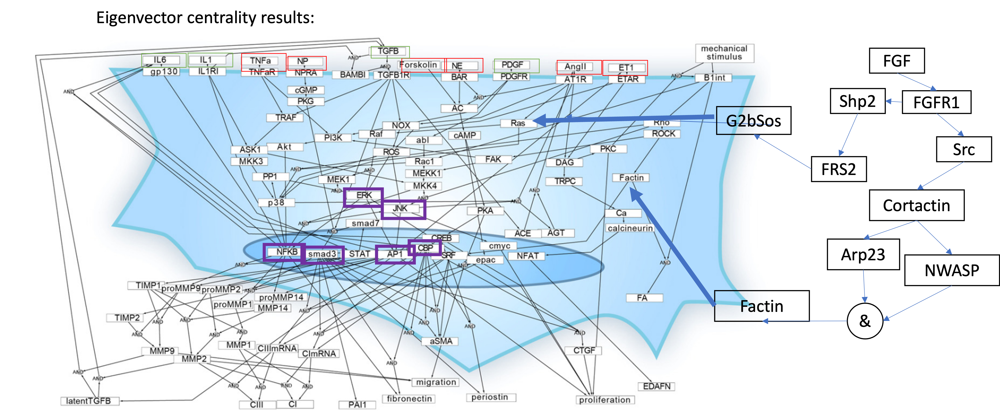

In [18]:
Image.open('eigcentrality.png')

The most connected or "central" nodes following the eigen-vector analysis for indirected networks were in the nucleus or close to it. This makes sense since all the mechanosensing pathways are supposed to sen information to the nucleus to start the mechanotransduction proccess. "Smad3" is the most "central" specie and that might tell us how important is its role in the signaling cascade.

### KATZ CENTRALITY in-degree

In [19]:
e=np.ones(75)

#set alpha as 1/r - 0.1 being r the max eigenvalue.
alpha=1/realpart
alpha=alpha-0.1
# print(alpha)
beta=0.5 #beta can be any number preferably between 0 and 1. I have been changing this beta 
# value in that range and it does not really change the "centrality ranking of all species".

# Of course that beta incides in the centrality value (c) of each node but we should use c 
# to compare between nodes and not to assess centrality or connectivity of each one. 
# c does not have a significant meaning by itself.


# here i will compute c vector as the solution of (I-alphaA)c=beta*e. 
# Note that I am using A transpose and that is the only difference between in-degree
# and out-degree katz centrality computation
alphaat=alpha*np.transpose(A)
invert=np.eye(75)-alphaat
c=np.linalg.solve(invert,beta*e)

# Here I sort the centrality values in c from the highest to the lowest.
csortedindex=np.zeros(75)
csorted=sorted(c, reverse=True)
# print(csorted)

In [20]:
init=np.zeros(75)
cont=0
while cont < 75:
    posit=np.where(c == csorted[cont])[0]
    lenp=len(posit)
    for f in range(lenp):
        init[cont]=posit[f]
        # print(cont)
        cont=cont+1

# print(init)


In [21]:
# Initialize vector for ranking species based on their eigenvector centrality (NAMES).
nameskatz=['']*75

for v in range(len(init)):
    if init[v]!=0:
        pos=np.where(init[v]==namesposi[:,1])
        nameskatz[v]=namesposi[pos,0][0][0]

In [22]:
print(nameskatz)

['CI', 'CIII', 'proMMP1', 'proliferation', 'PI3K', 'proMMP9', 'MMP9', 'migration', 'fibronectin', 'TGFB', 'NFKB', 'IL6', 'proMMP14', 'JNK', 'MMP1', 'MMP2', 'TGFB1R', 'CTGF', 'AP1', 'aSMA', 'CImRNA', 'CIIImRNA', 'proMMP2', 'Akt', 'BAMBI', 'smad3', 'ERK', 'p38', 'periostin', 'TRAF', 'gp130', 'MMP14', 'cmyc', '', 'latentTGFB', 'TIMP1', 'TIMP2', 'MEK1', 'ASK1', 'MKK4', 'CBP', 'PAI1', 'PP1', 'STAT', 'ROS', 'Factin', 'MKK3', 'FA', 'MEKK1', 'smad7', 'Src', 'SRF', 'FAK', 'Rac1', 'cortactin', 'NWASP', 'Arp23', 'Raf', 'Ras', 'ROCK', 'Grb2Sos', 'Rho', 'abl', 'Shp2', 'FRS2', 'PDGFR', 'B1int', 'IL1RI', 'TNFaR', 'FGFR1', 'PDGF', 'mechanical', 'IL1', 'TNFa', 'FGF']


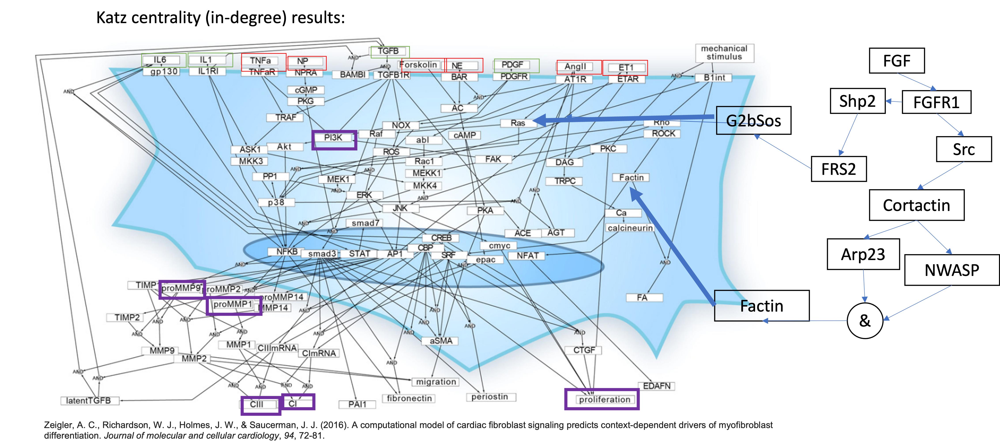

In [23]:
Image.open('katzIN.png')

Since we are analyzing the network considering in-degree connectoins, it makes sense that the most "central" nodes are located at the end of the network because they are outputs or they are close to the outputs. The most "central" nodes based on thi analysis were collagen type I and III, proMMP1, proliferation, and PI3K.

KATZ CENTRALITY out-degree (just have to transpose A (the adjacency matrix))

In [24]:
e=np.ones(75)

# here i will compute c vector as the solution of (I-alphaA)c=beta*e. 
# Note that I am using A (and not A transpose) and that is the only difference 
# between in-degree and out-degree katz centrality computation
alphaa=alpha*A
invert1=np.eye(75)-alphaa
c1=np.linalg.solve(invert1,beta*e)
# print(c)

# Here I sort the centrality values in c1 from the highest to the lowest.
csortedindex1=np.zeros(75)
csorted1=sorted(c1, reverse=True)
# print(csorted1)

In [25]:
#initialize vector for getting species number ranked.

init1=np.zeros(75)
cont1=0
while cont1 < 75:
    posit1=np.where(c1 == csorted1[cont1])[0]
    lenp1=len(posit1)
    for f in range(lenp1):
        init1[cont1]=posit1[f]
        # print(cont)
        cont1=cont1+1


In [26]:
# Initialize vector for ranking species based on their eigenvector centrality (NAMES).
nameskatz2=['']*75

#Get vector with the names of the species ranked from the highest to the lowest.
for v in range(len(init1)):
    if init1[v]!=0:
        pos=np.where(init1[v]==namesposi[:,1])
        nameskatz2[v]=namesposi[pos,0][0][0]

### Here I print the ranked species for the out-degree centrality analysis.

In [27]:
print(nameskatz2)

['ROS', 'ERK', 'p38', 'Rho', 'AP1', 'B1int', 'TGFB1R', 'IL1RI', '', 'Ras', 'TGFB', 'Rac1', 'NFKB', 'JNK', 'PP1', 'MEK1', 'MKK3', 'ASK1', 'mechanical', 'BAMBI', 'MMP2', 'IL1', 'FGFR1', 'smad3', 'Grb2Sos', 'latentTGFB', 'abl', 'Akt', 'TIMP1', 'MKK4', 'STAT', 'Raf', 'PDGFR', 'FAK', 'TNFaR', 'TRAF', 'ROCK', 'proMMP2', 'MMP14', 'FGF', 'smad7', 'FRS2', 'CBP', 'PI3K', 'MEKK1', 'gp130', 'PDGF', 'TNFa', 'proMMP14', 'cortactin', 'IL6', 'SRF', 'Factin', 'Src', 'NWASP', 'Arp23', 'MMP1', 'proMMP1', 'TIMP2', 'proMMP9', 'cmyc', 'CTGF', 'MMP9', 'CImRNA', 'CIIImRNA', 'FA', 'migration', 'proliferation', 'aSMA', 'PAI1', 'fibronectin', 'periostin', 'CI', 'CIII', 'Shp2']


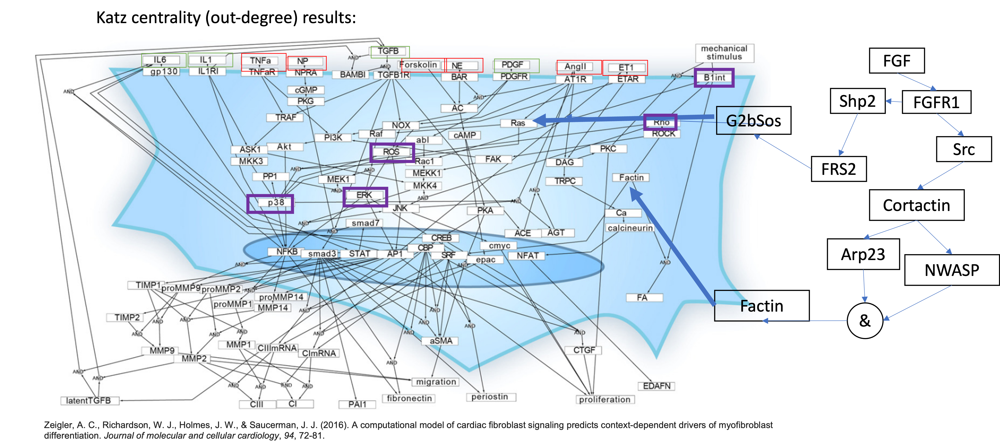

In [28]:
Image.open('katzOUT.png')

It makes sense that nodes that are up in the network have the highest out-degree katz centrality. In this case, ROS and ERK appear to have a high influence on the downstream nodes.

## BETWEENNESS CENTRALITY
It is often used to find nodes that serve as a bridge from one part of a graph to another. The algorithm calculates shortest paths between all pairs of nodes in a graph